In [ ]:
!pip install SimpleITK

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Enter the path to the DICOM directory: /content/drive/MyDrive/MRI2
Enter the path to the directory: /content/drive/MyDrive/MRI2


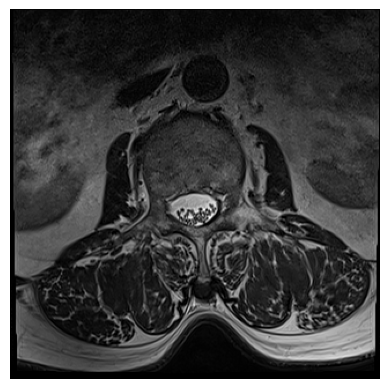

In [ ]:
import SimpleITK as sitk
import numpy as np
import os
import matplotlib.pyplot as plt

# Load DICOM images and create a 3D volume
def load_dicom_series(dicom_dir):
    # Read the image series
    reader = sitk.ImageSeriesReader()
    dicom_files = reader.GetGDCMSeriesFileNames(dicom_dir)
    reader.SetFileNames(dicom_files)

    # Load the DICOM image series into a 3D image
    image = reader.Execute()
    image_array = sitk.GetArrayFromImage(image)  # Convert to numpy array
    return image_array

# Preprocess DICOM slices
def preprocess_mri(mri_array):
    # Normalize the image intensity
    mri_array = (mri_array - np.min(mri_array)) / (np.max(mri_array) - np.min(mri_array))
    return mri_array

# Visualize a slice for verification
def visualize_slice(mri_array, slice_idx):
    plt.imshow(mri_array[slice_idx], cmap='gray')
    plt.axis('off')
    plt.show()

# Ask user for DICOM directory path
dicom_dir = input("Enter the path to the DICOM directory: ")

def count_dcm_images(dicom_dir):
    # List all files in the given directory
    files = os.listdir(dicom_dir)

    # Filter and count only the .dcm files
    dcm_files = [file for file in files if file.lower().endswith('.dcm')]

    # Return the number of DICOM files
    return len(dcm_files)

# Accept directory path as input from the user
directory_path = input("Enter the path to the directory: ")

# Count DICOM files
num_dcm_files = count_dcm_images(dicom_dir)

slice_idx = num_dcm_files-1

# Load and preprocess DICOM images
mri_data = load_dicom_series(dicom_dir)
mri_data = preprocess_mri(mri_data)
visualize_slice(mri_data, slice_idx)


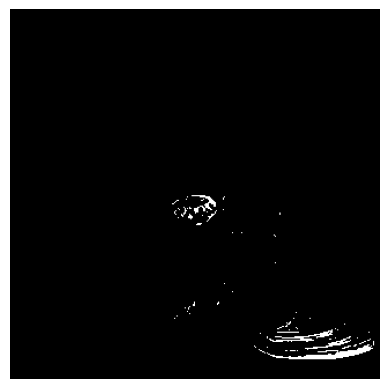

In [ ]:
import torch
from torchvision import transforms

# Placeholder segmentation function
def segment_mri(mri_slice):
    segmented_slice = mri_slice > 0.5  # Apply a threshold for demonstration
    return segmented_slice

# Apply segmentation across the volume
segmented_volume = np.array([segment_mri(slice_) for slice_ in mri_data])

# Visualize segmentation result
visualize_slice(segmented_volume, slice_idx)

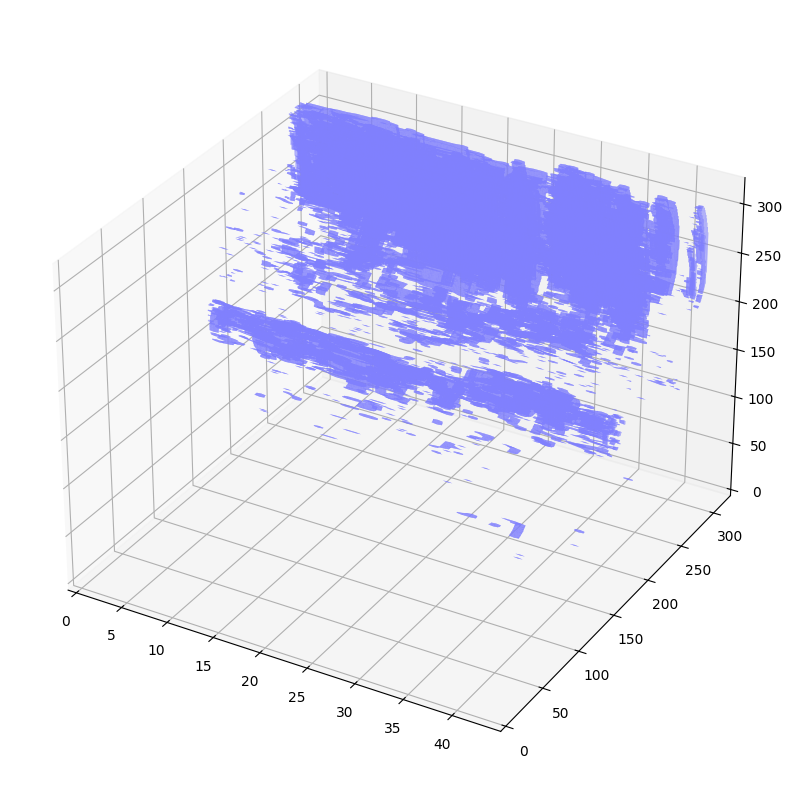

In [ ]:
from skimage import measure
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.pyplot as plt

# Apply 3D reconstruction with marching cubes
def reconstruct_3d(segmented_volume, step_size=1):
    verts, faces, _, _ = measure.marching_cubes(segmented_volume, step_size=step_size)
    return verts, faces

# Visualize the 3D reconstruction
def plot_3d(verts, faces):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")
    mesh = Poly3DCollection(verts[faces], alpha=0.7)
    mesh.set_facecolor([0.5, 0.5, 1])
    ax.add_collection3d(mesh)
    ax.set_xlim(0, segmented_volume.shape[0])
    ax.set_ylim(0, segmented_volume.shape[1])
    ax.set_zlim(0, segmented_volume.shape[2])
    plt.show()

# Reconstruct and plot
verts, faces = reconstruct_3d(segmented_volume)
plot_3d(verts, faces)

In [ ]:
!pip install trimesh


In [ ]:
import trimesh

# Save the 3D model to STL
def save_model_to_stl(verts, faces, output_path="3d_model.stl"):
    mesh = trimesh.Trimesh(vertices=verts, faces=faces)
    mesh.export(output_path)

save_model_to_stl(verts, faces, "body_part_3d_model.stl")
print("3D model saved to body_part_3d_model.stl")



3D model saved to body_part_3d_model.stl


In [ ]:
import trimesh
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

# Load STL model
mesh = trimesh.load("body_part_3d_model.stl")

# Simple display using trimesh in Python
mesh.show()

# Optional: Interactive plot using Plotly
def plot_3d_interactive(stl_path):
    mesh = trimesh.load(stl_path)
    fig = go.Figure(data=[go.Mesh3d(
        x=mesh.vertices[:,0],
        y=mesh.vertices[:,1],
        z=mesh.vertices[:,2],
        i=mesh.faces[:,0],
        j=mesh.faces[:,1],
        k=mesh.faces[:,2],
        color='lightblue',
        opacity=0.5
    )])
    fig.update_layout(scene_aspectmode='data')
    fig.show()

# Call function to visualize in an interactive plot
plot_3d_interactive("body_part_3d_model.stl")
